In [49]:
from model import get_ebenhoeh2011
from mxlpy import scan, Model, Simulator
import pandas as pd
import mxlbricks.names as n
import numpy as np
from mxlpy.integrators import Scipy
from functools import partial

### Str Dict

In [50]:
pfd_str = n.pfd()
protons_lumen_str = n.h("_lumen")

In [51]:
m = get_ebenhoeh2011()

m.update_parameter(pfd_str, 10)

m.get_fluxes(time=10)

v1    1.666667e+01
v2    4.250000e+06
v3    0.000000e+00
v4    0.000000e+00
v5    2.560000e+03
v6    5.001685e-11
v7    0.000000e+00
v8    0.000000e+00
v9    0.000000e+00
dtype: float64

In [52]:
s = Simulator(m, integrator=Scipy)

s.simulate(1)

res = s.get_result().unwrap_or_err().get_combined()

res

,A0,A1,Plastoquinone (oxidised),protons_lumen,Q_active,ATP_stroma,A2,Plastoquinone (reduced),ADP_stroma,Q_inactive,v1,v2,v3,v4,v5,v6,v7,v8,v9
0.000000,1.250000,1.250000,0.000000,0.000063,0.000000,0.000000e+00,-2.220446e-16,17.500000,32.0,1.000000,16.666667,4.250000e+06,-6.061818e-10,0.000000,2.560000e+03,5.001685e-11,0.000000,0.000000,0.000000e+00
0.010101,2.470092,0.000010,0.998253,0.037215,0.000505,1.460974e-19,2.989804e-02,16.501747,32.0,0.999495,32.917935,3.291793e+01,3.343554e+01,49.912668,2.642506e+02,4.997404e-02,0.000002,0.371515,2.921948e-18
0.020202,2.474190,0.000010,0.866808,0.048509,0.001010,2.253468e-15,2.580037e-02,16.633192,32.0,0.998990,32.955896,3.295590e+01,3.326697e+01,43.340375,-1.219742e+08,4.994933e-02,0.000004,0.484452,4.506936e-14
0.030303,2.476670,0.000010,0.786441,0.059272,0.001514,-4.724815e-14,2.332021e-02,16.713559,32.0,0.998486,32.972276,3.297228e+01,3.316171e+01,39.322071,6.515690e+09,4.992424e-02,0.000006,0.592087,-9.449631e-13
0.040404,2.478178,0.000010,0.737265,0.069706,0.002018,-8.628665e-13,2.181190e-02,16.762735,32.0,0.997982,32.975700,3.297570e+01,3.309113e+01,36.863270,2.536014e+11,4.989907e-02,0.000008,0.696429,-1.725733e-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.959596,2.481402,0.000009,0.631410,0.914392,0.046758,4.766989e-19,1.858833e-02,16.868590,32.0,0.953242,31.538365,3.153837e+01,3.153931e+01,31.570519,-2.307462e+10,4.766211e-02,0.000187,9.143286,9.533978e-18
0.969697,2.481412,0.000009,0.631095,0.923022,0.047237,5.546199e-19,1.857877e-02,16.868905,32.0,0.952763,31.522624,3.152262e+01,3.152357e+01,31.554762,-2.804944e+10,4.763814e-02,0.000189,9.229586,1.109240e-17
0.979798,2.481422,0.000009,0.630780,0.931639,0.047716,7.014926e-20,1.856922e-02,16.869220,32.0,0.952284,31.506893,3.150689e+01,3.150784e+01,31.539013,-3.704959e+09,4.761418e-02,0.000191,9.315751,1.402985e-18
0.989899,2.481431,0.000009,0.630465,0.940242,0.048195,-2.797736e-19,1.855968e-02,16.869535,32.0,0.951805,31.491169,3.149117e+01,3.149211e+01,31.523272,1.542399e+10,4.759023e-02,0.000193,9.401782,-5.595472e-18


# Figure 2

In [53]:
def fig2_sim(
    model: Model
):
    
    res_df = {}
    
    res = scan.steady_state(
        model=model,
        to_scan=pd.DataFrame({
    
    # for par in ["k4"]:
    #     ref_val = model.get_parameter_values()[par]
    #     factor_lst = [1, 0.5, 0.25, 2, 4]
        
    #     res = scan.steady_state(
    #         model=model,
    #         to_scan=pd.DataFrame({par: [ref_val * factor for factor in factor_lst]})
    #     )
        
    #     res = res.combined
    
    return res_df

SyntaxError: '{' was never closed (3022246556.py, line 9)

In [ ]:
fig2_sim(get_ebenhoeh2011()).combined

# Figure 3

In [61]:
def fig3_sim(
    model: Model,
    pfd_str: str,
    protons_lumen_str: str
):
    model.update_parameters({
        pfd_str: 800,
    })
    
    res = scan.steady_state(
        model=model,
        to_scan=pd.DataFrame({protons_lumen_str: [10**(-i) for i in np.arange(5, 7.5, 0.1)]}),
        integrator=partial(Scipy, atol=1e-12, rtol=1e-12)
    ).combined
    
    res.index = -np.log10(res.index)
    
    return res

In [62]:
res = fig3_sim(
    model=get_ebenhoeh2011(),
    pfd_str=pfd_str,
    protons_lumen_str=protons_lumen_str
)

res

  0%|          | 0/25 [00:00<?, ?it/s]/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Repeated convergence failures (perhaps bad Jacobian or tolerances).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Repeated

 lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin    l
      in above,  r1 =  0.3955480446946D-05   r2 =  0.9117642295804D-13
 lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin    l
      in above,  r1 =  0.7084508634951D-05   r2 =  0.1031122250438D-12
 lsoda--  at t (=r1), too much accuracy requested    
       for precision of machine..  see tolsf (=r2)   
      in above,  r1 =  0.8501950815192D-05   r2 =                  NaN
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  at start of problem, too much accuracy     
       

,A0,A1,Plastoquinone (oxidised),protons_lumen,Q_active,ATP_stroma,A2,Plastoquinone (reduced),ADP_stroma,Q_inactive,v1,v2,v3,v4,v5,v6,v7,v8,v9
protons_lumen,,,,,,,,,,,,,,,,,,,
5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5.1,2.461178,0.000774,1.220512,0.025185,1.949466e-07,1.007610e-18,0.038048,16.279488,32.0,1.000000,2625.255866,2630.980477,2905.955073,61.025596,7.844392e-11,0.049995,7.797864e-10,0.251218,2.015219e-17
5.2,2.461181,0.000774,1.220548,0.025184,1.955869e-07,-1.121708e-18,0.038045,16.279452,32.0,1.000000,2625.259631,2630.735087,2894.019504,61.027419,5.409385e+03,0.049995,7.823475e-10,0.251208,-2.243417e-17
5.3,2.461065,0.000772,1.228422,0.025348,3.513798e-07,9.776729e-19,0.038162,16.271578,32.0,1.000000,2625.135552,2625.161116,2545.554868,61.421121,-2.222009e-09,0.049995,1.405519e-09,0.252851,1.955346e-17
5.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5.7,2.461213,0.000772,1.223649,0.025244,2.554295e-07,9.967872e-19,0.038015,16.276351,32.0,1.000000,2625.293002,2625.399598,2560.478513,61.182463,2.855899e-08,0.049995,1.021718e-09,0.251801,1.993574e-17
5.8,2.461212,0.000772,1.223676,0.025244,2.559736e-07,9.967562e-19,0.038016,16.276324,32.0,1.000000,2625.292232,2625.395849,2560.086763,61.183823,1.409774e-08,0.049995,1.023895e-09,0.251803,1.993512e-17


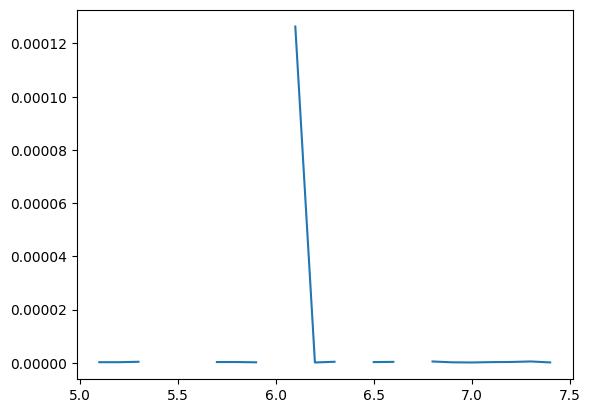

In [63]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots()

ax.plot(res["Q_active"])

plt.show()

# Figure 4

In [69]:
def fig4_sim(
    model: Model,
    pfd_str: str
):
    res = scan.steady_state(
        model=model,
        to_scan=pd.DataFrame({pfd_str: np.linspace(0, 2000, 100)}),
        integrator=partial(Scipy, atol=1e-12, rtol=1e-12)
    ).combined
    
    return res

In [70]:
res = fig4_sim(
    model=get_ebenhoeh2011(),
    pfd_str=pfd_str
)

  0%|          | 0/100 [00:00<?, ?it/s]/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Repeated convergence failures (perhaps bad Jacobian or tolerances).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Repeate

 lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin    l
      in above,  r1 =  0.8335051777006D-05   r2 =  0.1078863626696D-12
 lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin    l
      in above,  r1 =  0.1231188188382D-04   r2 =  0.1230567209725D-12
 lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin    l
      in above,  r1 =  0.2577577252281D-03   r2 =  0.2329600397476D-13
 lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin    l
      in above,  r1 =  0.2921262951734D-03   r2 =  0.5087038259654D-13
 lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin    l
      

/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess accuracy requested (tolerances too small).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self.

chine..  see tolsf (=r1) 
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
      in above message,  r1 =                  NaN
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =       

/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess accuracy requested (tolerances too small).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/tests/models/ebenhoeh2011/model.py:13: RuntimeWarning: invalid value encountered in scalar power
  K_eq = Pi * np.exp(-(DeltaG_ATP) / (R * T)) * (H_st / H_lu) **

precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  at start of problem, too much accuracy     
 lsoda--  repeated occurrences of illegal input      
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  at start of problem, too much accuracy     
 lsoda--  repeated occurrences of illegal input      
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
 lsoda--  at start of problem, too much accuracy     
      in above messag

/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess work done on this call (perhaps wrong Dfun type).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/tests/models/ebenhoeh2011/model.py:13: RuntimeWarning: invalid value encountered in scalar power
  K_eq = Pi * np.exp(-(DeltaG_ATP) / (R * T)) * (H_st / H_lu) ** (14/3)
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Excess accuracy requested (tolerances too small).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/elouencorvestnew/Documents/mxl-bricks-elouen/.pixi/envs/default/lib/python3.12/site-packages/scipy/integrate/_ode.py:438: UserWarning: lsoda: Illegal input detected (internal error).
  self._y, self.t = mth(self.f, self.jac or (lambda: None),
/home/el

=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
 lsoda--  at start of problem, too much accuracy     
       requested for precision of machine..  see tolsf (=r1) 
      in above message,  r1 =                  NaN
 lsoda--  repeated occurrences of illegal input      
     

100%|██████████| 100/100 [00:01<00:00, 98.45it/s]


In [72]:
res

,A0,A1,Plastoquinone (oxidised),protons_lumen,Q_active,ATP_stroma,A2,Plastoquinone (reduced),ADP_stroma,Q_inactive,v1,v2,v3,v4,v5,v6,v7,v8,v9
PPFD,,,,,,,,,,,,,,,,,,,
0.000000,2.463282,1.787803e-07,1.213041,0.025066,2.289768e-07,1.030197e-18,0.036717,16.286959,32.0,1.000000,0.000000,0.607853,62.781860,60.652059,-1.705303e-12,0.049995,9.159073e-10,0.250024,2.060394e-17
20.202020,2.463253,1.951477e-05,1.213319,0.025078,4.139415e-07,1.027807e-18,0.036727,16.286681,32.0,1.000000,66.350225,66.350231,66.177744,60.665948,2.103206e-11,0.049995,1.655766e-09,0.250149,2.055614e-17
40.404040,2.463185,3.902847e-05,1.214069,0.025101,6.127623e-07,1.023382e-18,0.036776,16.285931,32.0,0.999999,132.696752,132.696790,130.464243,60.703426,-2.046363e-10,0.049995,2.451049e-09,0.250381,2.046763e-17
60.606061,2.463115,5.854105e-05,1.214878,0.025120,6.434737e-07,1.019900e-18,0.036827,16.285122,32.0,0.999999,199.039458,199.039557,194.746440,60.743924,4.541789e-10,0.049995,2.573895e-09,0.250564,2.039801e-17
80.808081,2.461281,7.799555e-05,1.270593,0.026790,1.460214e-05,7.552397e-19,0.038641,16.229407,32.0,0.999985,265.184679,265.184882,258.892807,63.529633,-7.505428e-02,0.049996,5.840857e-08,0.267269,1.510479e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1919.191919,2.458393,1.852048e-03,1.230764,0.025480,1.927372e-07,3.728797e-16,0.039755,16.269236,32.0,1.000000,6290.834844,6296.964848,6497.507155,61.538176,-9.976329e+05,0.049995,7.709490e-10,0.254163,7.457594e-15
1939.393939,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1959.595960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


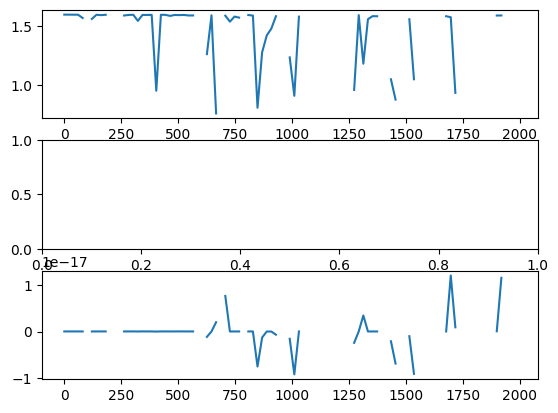

In [73]:
fig, axs = plt.subplots(nrows=3)

axs[0].plot(-np.log10(res[n.h("_lumen")]))
axs[2].plot(res[n.atp("_stroma")] / m.get_parameter_values()[n.total_adenosines()])